# 학습목표
- 딥러닝을 적용하여 핸드폰 인물 사진 모드를 따라 해 보자.

# 목차

#### 노드 따라가기
- 필요한 모듈과 사진을 준비하기

- 시맨틱 세그멘테이션 다뤄보기

 - 세그멘테이션 결과를 원래 크기로 복원하기 
 - 배경 흐리게 하기
 - 흐린 배경과 원본 영상 합성하기

- 문제점 찾기

#### 프로젝트

- 문제점 해결해보기

 - 마스크 범위 수정하기
 - 마스크에 블러 효과 주기
 - 영상 분리하기
 - 영상 합성하기
 - 결과 비교하기

- 여러가지 사진으로 시도하기

- 크로마키 합성 하기

- 인물 모드 문제점 찾기
 - 세그멘테이션을 이용한 인물모드의 한계
 - 피사계심도 이해하기
 - 스마트폰으로는 아웃포커싱이 불가능한가?
 - 접근방항

- 해결 방안 순서도

#### 회고


# 일단 노드 따라가기


## 필요한 모듈과 사진을 준비하기

이미지 출처 : [pixabay](https://pixabay.com/ko/photos/%eb%b6%84-%eb%8c%80-%ec%9e%90%eb%8f%99%ec%b0%a8-%ea%b2%bd%ec%b0%b0-%ec%a1%b0%eb%aa%85-1209719/)

In [1]:
import cv2
import numpy as np
import os
import tarfile
import urllib

from matplotlib import pyplot as plt
import tensorflow as tf

In [2]:
car_img_path = '/content/drive/MyDrive/Colab/human_segmentation/images/squad_car.jpg'
car_orig = cv2.imread(car_img_path) 
print (car_orig.shape)


(346, 640, 3)


## 시맨틱 세그멘테이션 다뤄보기

In [3]:
# DeepLab 모델. 구글에서 제공하는 모델 구조 그대로 -> DeepLabModel 클래스

class DeepLabModel(object):
    INPUT_TENSOR_NAME = 'ImageTensor:0'
    OUTPUT_TENSOR_NAME = 'SemanticPredictions:0'
    INPUT_SIZE = 513
    FROZEN_GRAPH_NAME = 'frozen_inference_graph'

    # __init__()에서 모델 구조를 직접 구현하는 대신, tar file에서 읽어들인 그래프구조 graph_def를 
    # tf.compat.v1.import_graph_def를 통해 불러들여 활용하게 됩니다. 
    def __init__(self, tarball_path):
        self.graph = tf.Graph()
        graph_def = None
        tar_file = tarfile.open(tarball_path)
        for tar_info in tar_file.getmembers():
            if self.FROZEN_GRAPH_NAME in os.path.basename(tar_info.name):
                file_handle = tar_file.extractfile(tar_info)
                graph_def = tf.compat.v1.GraphDef.FromString(file_handle.read())
                break
        tar_file.close()

        with self.graph.as_default():
    	    tf.compat.v1.import_graph_def(graph_def, name='')

        self.sess = tf.compat.v1.Session(graph=self.graph)

    # 이미지를 전처리하여 Tensorflow 입력으로 사용 가능한 shape의 Numpy Array로 변환합니다.
    def preprocess(self, img_orig):
        height, width = img_orig.shape[:2]
        resize_ratio = 1.0 * self.INPUT_SIZE / max(width, height)
        target_size = (int(resize_ratio * width), int(resize_ratio * height))
        resized_image = cv2.resize(img_orig, target_size)
        resized_rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)
        img_input = resized_rgb
        return img_input
        
    def run(self, image):
        img_input = self.preprocess(image)

        # Tensorflow V1에서는 model(input) 방식이 아니라 sess.run(feed_dict={input...}) 방식을 활용합니다.
        batch_seg_map = self.sess.run(
            self.OUTPUT_TENSOR_NAME,
            feed_dict={self.INPUT_TENSOR_NAME: [img_input]})

        seg_map = batch_seg_map[0]
        return cv2.cvtColor(img_input, cv2.COLOR_RGB2BGR), seg_map

print('done')

done


In [4]:
# define model and download & load pretrained weight

_DOWNLOAD_URL_PREFIX = 'http://download.tensorflow.org/models/'

model_dir = '/content/drive/MyDrive/Colab/human_segmentation/models'
tf.io.gfile.makedirs(model_dir)

print ('temp directory:', model_dir)

download_path = os.path.join(model_dir, 'deeplab_model.tar.gz')
if not os.path.exists(download_path):
    urllib.request.urlretrieve(_DOWNLOAD_URL_PREFIX + 'deeplabv3_mnv2_pascal_train_aug_2018_01_29.tar.gz',
                   download_path)

MODEL = DeepLabModel(download_path)
print('model loaded successfully!')

temp directory: /content/drive/MyDrive/Colab/human_segmentation/models
model loaded successfully!


(346, 640, 3) (277, 513, 3) 7


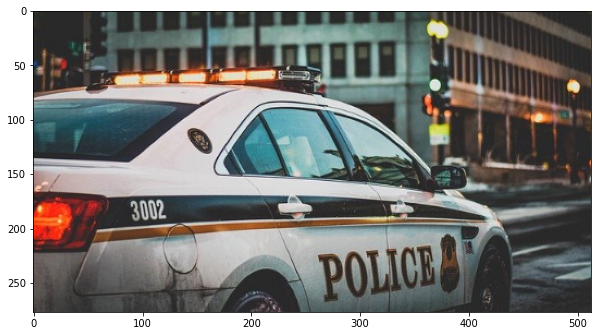

In [5]:
# 준비한 이미지를 네트워크에 입력, 사진을 필요한 만큼 축소해준다

car_resized, car_map = MODEL.run(car_orig)
print (car_orig.shape, car_resized.shape, car_map.max())

plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(car_resized, cv2.COLOR_BGR2RGB))
plt.show()

In [6]:
# 7번이 뭔지 확인

LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
LABEL_NAMES[7]

'car'

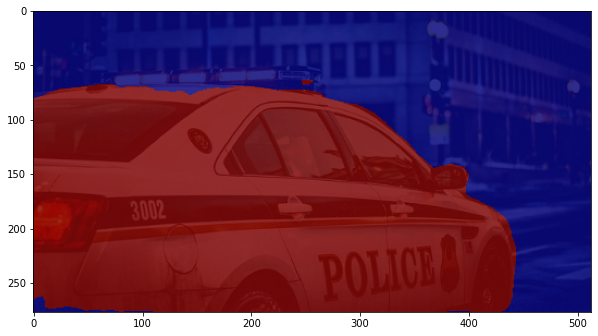

In [7]:
# 시맨틱 세그멘테이션 : 차와 차가 아닌걸 다른 색으로 구분

car_show = car_resized.copy() # 리사이즈 이미지 저장
car_map = np.where(car_map == 7, 7, 0) # 예측 중 픽셀값이 7 인 차만 추출
car_mask = car_map * (255/car_map.max()) # 255 normalization
# car_max.max() = 7 이므로 car_map / car_map.max()는 0과 1로 이루어진 행렬
# 255를 곱했으므로 차인 부분은 255, 차가 아닌 부분은 0인 마스크가 만들어진다
car_mask = car_mask.astype(np.uint8)
color_mask = cv2.applyColorMap(car_mask, cv2.COLORMAP_JET)
car_show = cv2.addWeighted(car_show, 0.2, color_mask, 0.8, 0.0)

fig = plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(car_show, cv2.COLOR_BGR2RGB))
plt.show()

### 세그멘테이션 결과를 원래 크기로 복원하기

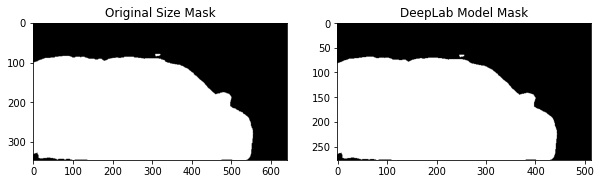

In [8]:
# 차만 보이는 마스크를 원본 사이즈로 리사이징
car_mask_up = cv2.resize(car_mask, car_orig.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)
_, car_mask_up = cv2.threshold(car_mask_up, 128, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(10, 8))

ax = plt.subplot(1,2,1)
plt.imshow(car_mask_up, cmap=plt.cm.binary_r)
ax.set_title('Original Size Mask')

ax = plt.subplot(1,2,2)
plt.imshow(car_mask, cmap=plt.cm.binary_r)
ax.set_title('DeepLab Model Mask')

plt.show()

### 배경 흐리게 하기

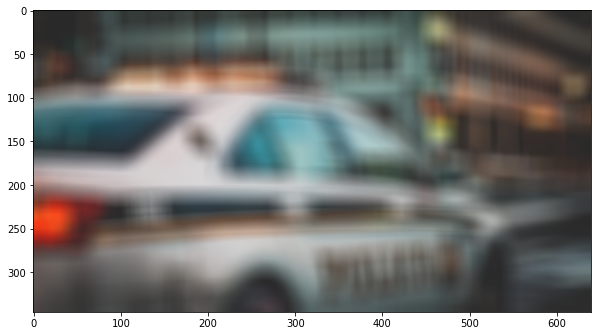

In [9]:
# blur() 함수를 이용해서 배경을 흐리게 만들기

car_orig_blur = cv2.blur(car_orig, (25,25)) #(25,25)은 blurring  kernel size를 뜻합니다.

plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(car_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

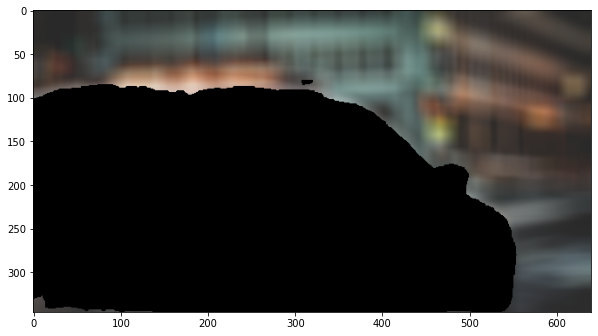

In [10]:
# 세그멘테이션 마스크를 이용해서 배경만 추출

car_mask_color = cv2.cvtColor(car_mask_up, cv2.COLOR_GRAY2BGR)
car_bg_mask = cv2.bitwise_not(car_mask_color) 
# 마스크 뒤집어서, 차는 0, 배경은 255인 마스크 만들기
car_bg_blur = cv2.bitwise_and(car_orig_blur, car_bg_mask) 
# 두 이미지 비트연산
# 하나라도 0이면 0(검은 마스크) 출력, 0이 아니면 최종 판단(이미지) 출력

plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(car_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

### 흐린 배경과 원본 영상 합성하기

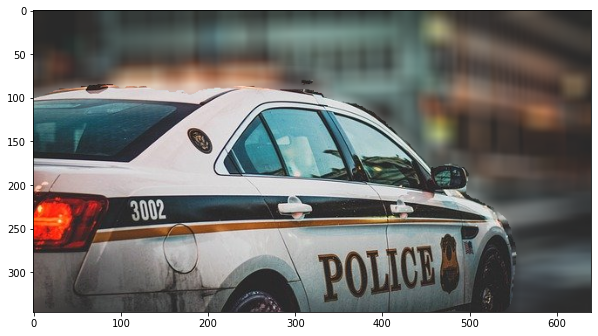

In [11]:
# 배경 영상과 자동차 영상을 합치기

car_concat = np.where(car_mask_color==255, car_orig, car_bg_blur)
# 마스크에서 255인 부분(차)은 car_origin, 아닌 부분은 car_bg_blur 를 사용

plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(car_concat, cv2.COLOR_BGR2RGB))
plt.show()

## 문제점 찾기

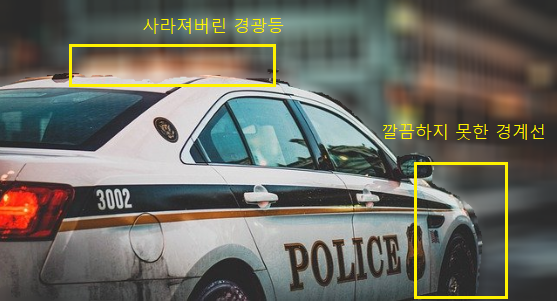

# 프로젝트

## 문제점 해결해보기


### 마스크 범위 수정하기

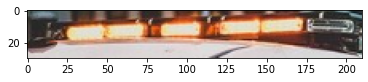

In [12]:
#마스크에 포함되지 않는 경광등 부분 잘라내서 확인

temp = car_resized[50:80,50:260].copy()
plt.imshow(cv2.cvtColor(temp, cv2.COLOR_BGR2RGB))
plt.show()

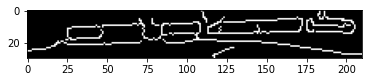

In [13]:
# 외곽선만 따내기

blur = cv2.GaussianBlur(temp, ksize=(7,7), sigmaX=0)
ret, thresh1 = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
edged = cv2.Canny(blur, 10, 250)
plt.imshow(cv2.cvtColor(edged, cv2.COLOR_BGR2RGB))
plt.show()

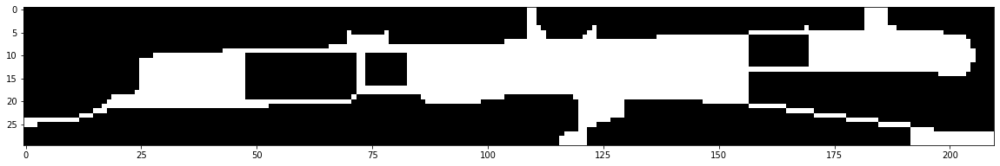

In [14]:
# 닫힌 공간 찾기

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(closed, cv2.COLOR_BGR2RGB))
plt.show()

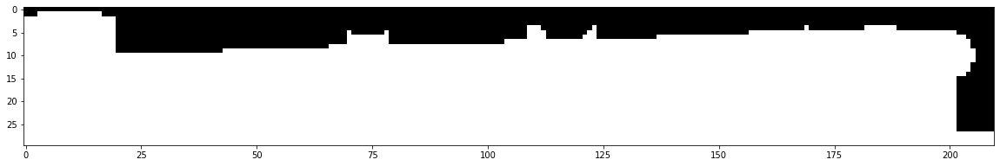

In [15]:
# 그래도 안 채워진 부분은 손으로 한땀한땀 채움

closed[10:, :157]=255
closed[5:, 157:202]=255
closed[:4, :]=0
closed[2:, :20]=255
closed[1:, 3:17]=255

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(closed, cv2.COLOR_BGR2RGB))
plt.show()

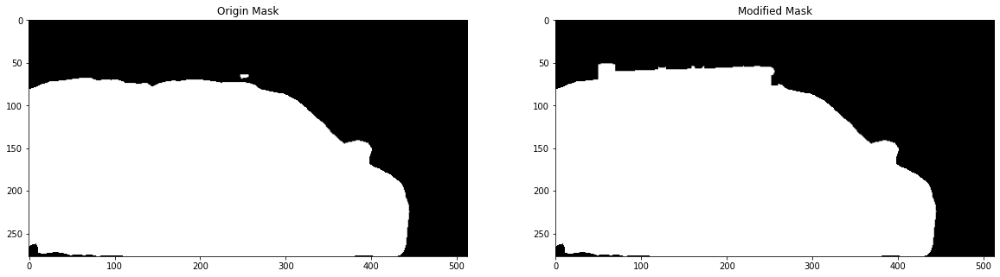

In [16]:
fig = plt.figure(figsize=(20, 15)) 

# 원래 마스크
ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(car_mask, cv2.COLOR_BGR2RGB))
ax.set_title('Origin Mask')

# 수정된 부분 덧붙인 마스크 생성
car_mask2 = car_mask.copy()
car_mask2[50:80,50:260] = closed

ax = plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(car_mask2, cv2.COLOR_BGR2RGB))
ax.set_title('Modified Mask')

plt.show()



car 마스크 크기: (277, 513)


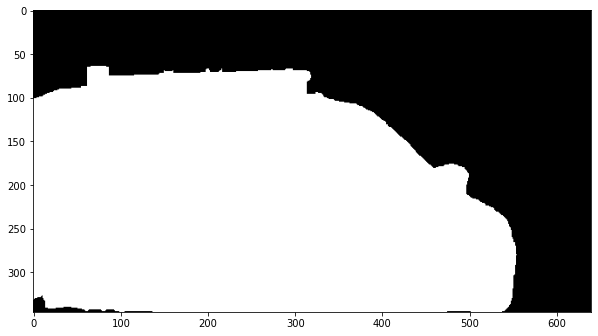

In [17]:
# 리사이징 한 마스크 출력

car_mask2_up = cv2.resize(car_mask2, car_orig.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)
_, car_mask2_up = cv2.threshold(car_mask2_up, 128, 255, cv2.THRESH_BINARY)

print(f'car 마스크 크기: {car_mask2.shape}')

fig = plt.figure(figsize=(10, 8))

plt.imshow(car_mask2_up, cmap=plt.cm.binary_r)

plt.show()

### 마스크에 블러 효과 주기

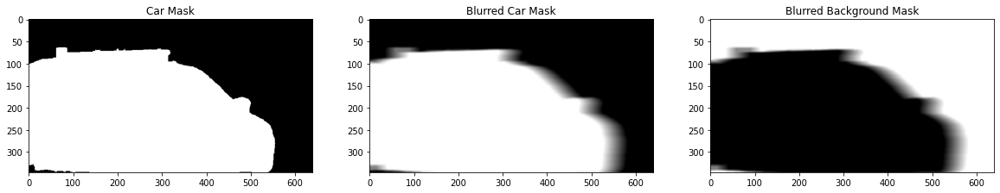

In [18]:
# 차만 보이는 마스크를 원본 이미지와 같은 채널로 변환
car_mask2_3C = np.repeat(np.expand_dims(car_mask2_up, axis=2), 3, axis=2).astype(np.uint8)
# 한 픽셀에 하나의 숫자 0, 255만 나타나있는 car_mask2_up 매트릭스를
# 한 픽셀에 [0,0,0], [255,255,255]인 텐서로 바꿔주는 역할

# 차만 보이는 마스크 블러 처리
car_Bmask = (cv2.blur(car_mask2_3C, (55, 5))/255).astype(np.float32)
# blur 함수로 픽셀들의 값이 [0,225] 사이의 값으로 부드럽게 바뀌고
# 255로 나눠주었으므로 [0,1] 사이의 값이 됨


# 마스크를 리버스해서 배경만 보이는 마스크 만들기
bg_Bmask = 1 - car_Bmask
# 값들이 float라서 노드처럼 bitwise 연산을 할 수는 없고
# 대신 1에서 마스크의 값을 빼주면 완벽하게 뒤집힌 마스크를 얻을 수 있음

fig = plt.figure(figsize=(20, 15)) 

ax = plt.subplot(1,3,1)
plt.imshow(car_mask2_up, cmap=plt.cm.binary_r) # 차만 보이는 마스크
ax.set_title('Car Mask')

ax = plt.subplot(1,3,2)
plt.imshow(car_Bmask, cmap=plt.cm.binary_r) # 차만 보이는 블러 마스크 
ax.set_title('Blurred Car Mask')

ax = plt.subplot(1,3,3)
plt.imshow(bg_Bmask, cmap=plt.cm.binary_r) # 배경만 보이는 블러 마스크  
ax.set_title('Blurred Background Mask')

plt.show()

### 영상 분리하기

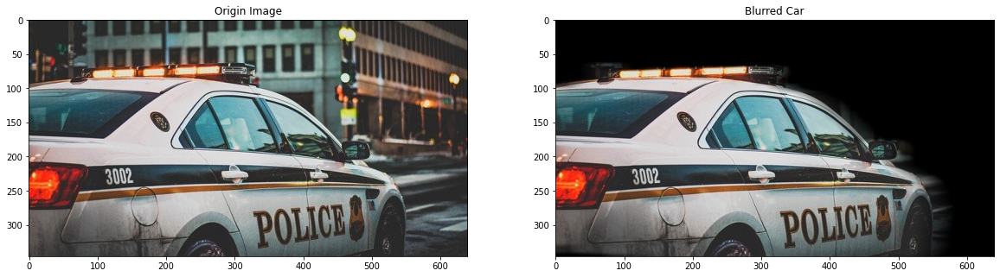

In [19]:
# 차만 보이는 마스크 * 원본이미지 로
# 경계면이 블러 처리된 차 얻기

car_image_Hblur = car_Bmask*car_orig.astype(np.float32)
# 이제 두 텐서를 원소별 곱연산 해주면, 경계는 원본의 픽셀값이 0.x 배로 감소해서 연해짐
# 차부분은 1 이므로 원본 이미지의 픽셀값이 그대로이므로 흐려지지 않음


fig = plt.figure(figsize=(20, 15)) 

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(car_orig, cv2.COLOR_BGR2RGB))
ax.set_title('Origin Image')

ax = plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(car_image_Hblur.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('Blurred Car')

plt.show()

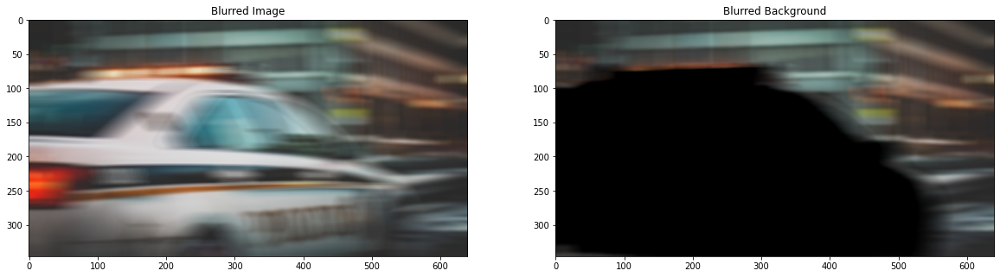

In [20]:
# blur() 함수를 이용해서 배경을 흐리게 만들기

car_orig_Hblur = cv2.blur(car_orig, (55,5)) #(13,13)은 blurring  kernel size를 뜻합니다.

# 배경만 보이는 마스크 * 블러이미지 로
# 전체가 블러 처리된 배경 얻기

bg_image_Hblur = bg_Bmask*car_orig_Hblur.astype(np.float32)

fig = plt.figure(figsize=(20, 15)) 

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(car_orig_Hblur, cv2.COLOR_BGR2RGB))
ax.set_title('Blurred Image')

ax = plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(bg_image_Hblur.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('Blurred Background')

plt.show()

### 영상 합성하기

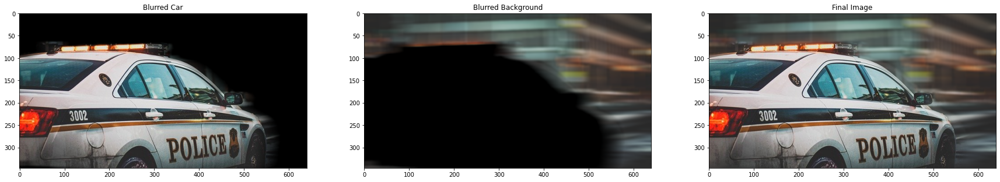

In [21]:
# 두 이미지를 합해서 최종 이미지 획득

final_image = (car_image_Hblur+bg_image_Hblur).astype(np.uint8)

fig = plt.figure(figsize=(30, 20)) 

ax = plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(car_image_Hblur.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('Blurred Car')

ax = plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(bg_image_Hblur.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('Blurred Background')

ax = plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(final_image,cv2.COLOR_BGR2RGB))
ax.set_title('Final Image')

plt.show()

### 결과 비교하기

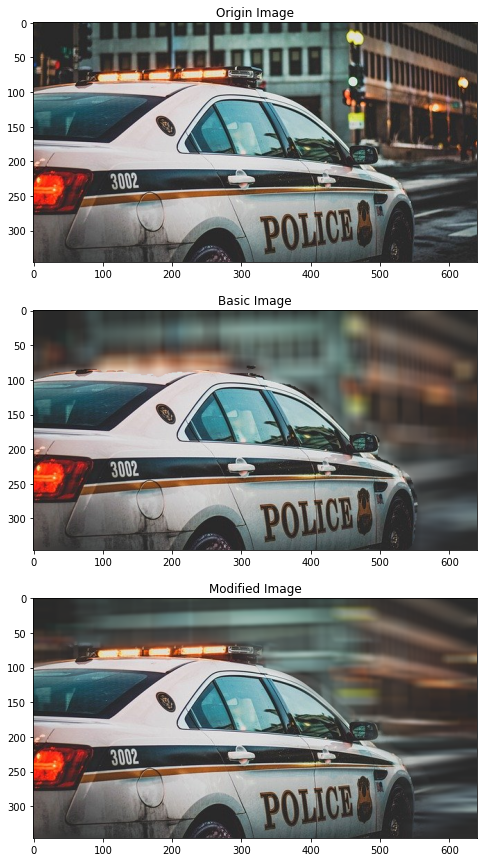

In [22]:
fig = plt.figure(figsize=(20, 15)) 

ax = plt.subplot(3,1,1)
plt.imshow(cv2.cvtColor(car_orig, cv2.COLOR_BGR2RGB))
ax.set_title('Origin Image')

ax = plt.subplot(3,1,2)
plt.imshow(cv2.cvtColor(car_concat, cv2.COLOR_BGR2RGB))
ax.set_title('Basic Image')

ax = plt.subplot(3,1,3)
plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
ax.set_title('Modified Image')

plt.show()

## 여러가지 사진으로 시도하기

이미지 출처: pixabay

[children](https://pixabay.com/ko/photos/%ec%96%b4%eb%a6%b0%ec%9d%b4-%ec%86%8c%eb%85%80-%ec%9e%90%ec%97%b0-%ed%99%94%eb%ac%bc-541955/)

[boys](https://pixabay.com/ko/photos/%ec%86%8c%eb%85%84-%ed%82%a4%ec%a6%88-%ec%9d%bd%ea%b8%b0-%ec%97%ac%eb%a6%84%ec%97%90-3396713/)

[tigers](https://pixabay.com/ko/photos/%ed%98%b8%eb%9e%91%ec%9d%b4-%ea%b2%ac%ec%8a%b5%ec%83%9d-%eb%88%88-%eb%82%98%eb%ac%b4-%ec%88%b2-591359/)

[plant](https://pixabay.com/ko/photos/%ec%8b%9d%eb%ac%bc-%eb%83%84%eb%b9%84-%ea%bd%83-%ed%99%94%eb%b6%84-%ec%8b%a0%ec%84%a0%ed%95%9c-1438317/)

[mom](https://pixabay.com/ko/photos/%ec%97%84%eb%a7%88-%eb%94%b8-%ea%b0%80%ec%a1%b1-%ec%95%84%ea%b8%b0-%ec%86%8c%eb%85%80-4211830/)


여러장을 처리할 수 있는 클래스로 만들어보기

In [23]:
class ShallowFocus:
    N = 15 # N = LABEL_NAME의 인덱스

    def __init__(self, jpg_img_name):
        folder_path = '/content/drive/MyDrive/Colab/human_segmentation/images/'
        self.img_orig = cv2.imread(folder_path + jpg_img_name + '.jpg')
        self.img_resized, self.img_map = MODEL.run(self.img_orig)

    def segment(self):
        N = self.N
        img_show = self.img_resized.copy() 
        img_map = np.where(self.img_map == N, N, 0)
        self.img_mask = (img_map * (255/img_map.max())).astype(np.uint8)
        color_mask = cv2.applyColorMap(self.img_mask, cv2.COLORMAP_JET)
        img_show = cv2.addWeighted(img_show, 0.2, color_mask, 0.8, 0.0)

        plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
        plt.show()
        return img_show

    def mask(self, BK): # BK : blurring  kernel size
        img_mask_up = cv2.resize(self.img_mask, self.img_orig.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)
        _, img_mask_up = cv2.threshold(img_mask_up, 128, 255, cv2.THRESH_BINARY)
        img_mask_3C = np.repeat(np.expand_dims(img_mask_up, axis=2), 3, axis=2).astype(np.uint8)
        self.img_Bmask = (cv2.blur(img_mask_3C, (BK, BK))/255).astype(np.float32)
        self.img_bg_Bmask = 1 - self.img_Bmask

        ax = plt.subplot(1,2,1)
        plt.imshow(self.img_Bmask, cmap=plt.cm.binary_r)
        ax = plt.subplot(1,2,2)
        plt.imshow(self.img_bg_Bmask, cmap=plt.cm.binary_r)
        plt.show()
        return self.img_Bmask, self.img_bg_Bmask

    def divide(self, BK):
        img_orig_blur = cv2.blur(self.img_orig, (BK, BK))
        img_blur = self.img_Bmask*self.img_orig.astype(np.float32)
        bg_blur = self.img_bg_Bmask*img_orig_blur.astype(np.float32)
        self.img_blur = img_blur.astype(np.uint8)
        self.bg_blur = bg_blur.astype(np.uint8)

        ax = plt.subplot(1,2,1)
        plt.imshow(cv2.cvtColor(self.img_blur, cv2.COLOR_BGR2RGB))
        ax = plt.subplot(1,2,2)
        plt.imshow(cv2.cvtColor(self.bg_blur, cv2.COLOR_BGR2RGB))
        plt.show()  
        return self.img_blur, self.bg_blur

    def bokeh(self):
        final_image = (self.img_blur+self.bg_blur)
        fig = plt.figure(figsize=(15, 12)) 
        ax = plt.subplot(2,1,1)
        plt.imshow(cv2.cvtColor(self.img_orig, cv2.COLOR_BGR2RGB))
        ax.set_title('Original Image')
        ax = plt.subplot(2,1,2)
        plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
        ax.set_title('Shallow Focus Image')
        plt.show()  
        return final_image

print('done')

done


In [24]:
class PortraitMode(ShallowFocus):
    pass # 그대로!

class BokehCat(ShallowFocus):
    N = LABEL_NAMES.index('cat') # 클래스 속성을 오버라이딩

class BokehAny(ShallowFocus):
    N = None

    def segment(self): # 메서드 오버라이딩
        N = self.img_map.max()
        print(f'이 사진은 {LABEL_NAMES[N]}입니다.') # 뭔지 알려주기
        img_show = self.img_resized.copy() 
        img_map = np.where(self.img_map == N, N, 0)
        self.img_mask = (img_map * (255/img_map.max())).astype(np.uint8)
        color_mask = cv2.applyColorMap(self.img_mask, cv2.COLORMAP_JET)
        img_show = cv2.addWeighted(img_show, 0.2, color_mask, 0.8, 0.0)

        plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
        plt.show()
        return img_show

In [25]:
# PortraitMode 확인

def out_focus(file_name, BK = 9):
    img = PortraitMode(file_name)
    img_show = img.segment()
    img_mask, bg_mask = img.mask(BK)
    img_blur, bg_blur = img.divide(BK)
    img_final = img.bokeh()

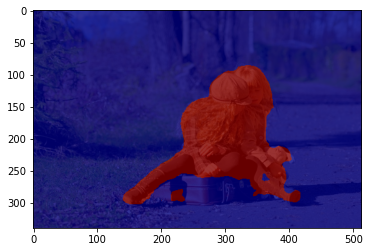

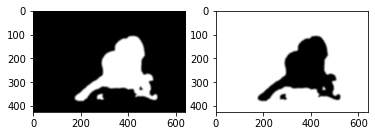

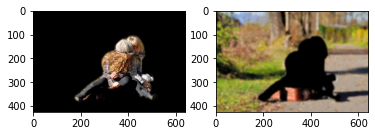

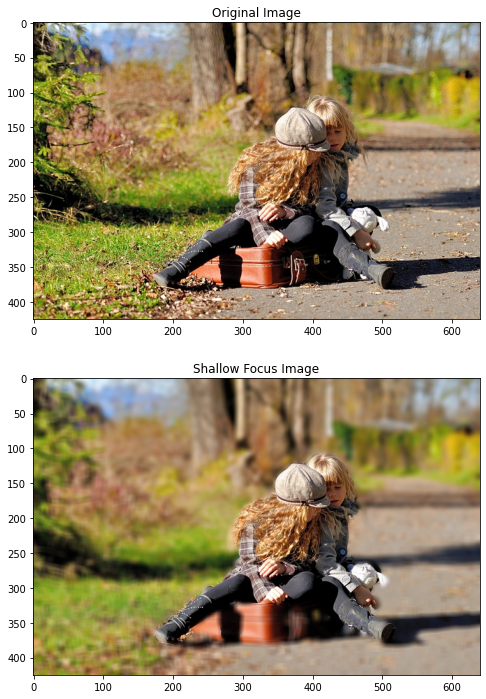

In [26]:
out_focus('children')

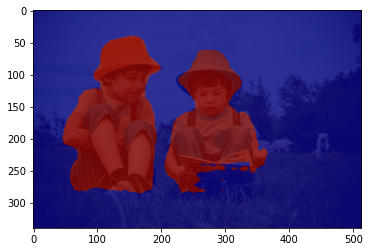

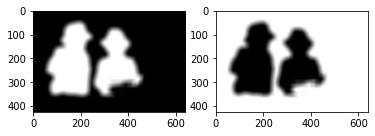

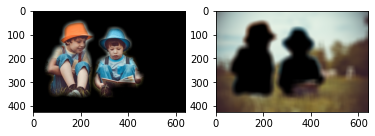

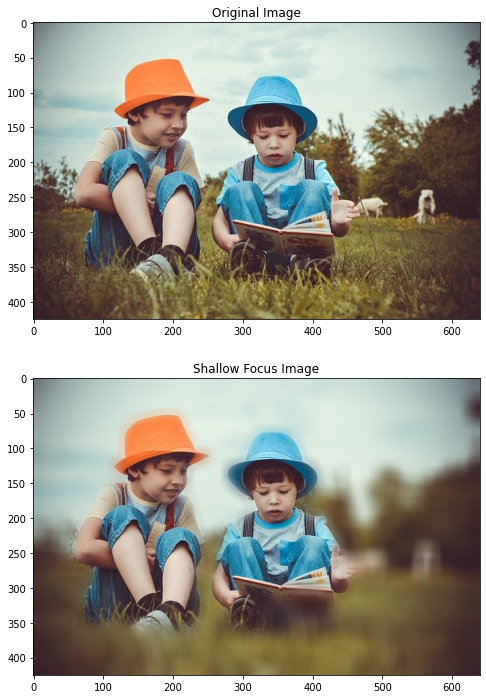

In [27]:
out_focus('boys', 25)

In [28]:
# BokehCat 확인

def out_focus2(file_name, BK = 9):
    img = BokehCat(file_name)
    img_show = img.segment()
    img_mask, bg_mask = img.mask(BK)
    img_blur, bg_blur = img.divide(BK)
    img_final = img.bokeh()

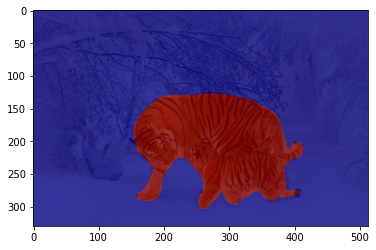

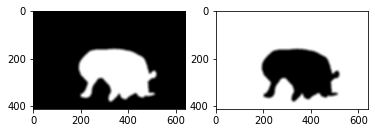

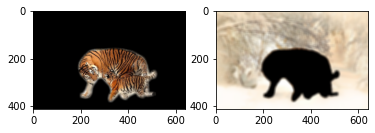

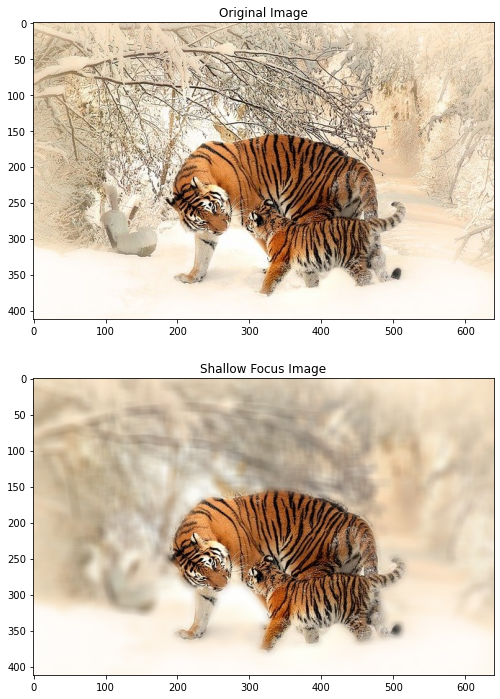

In [29]:
out_focus2('tigers', 13)

In [30]:
# BokehAny 확인

def out_focus3(file_name, BK=9):
    img = BokehAny(file_name)
    img_show = img.segment()
    img_mask, bg_mask = img.mask(BK)
    img_blur, bg_blur = img.divide(BK)
    img_final = img.bokeh()

이 사진은 pottedplant입니다.


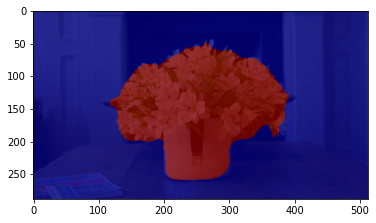

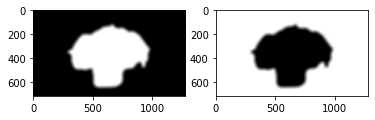

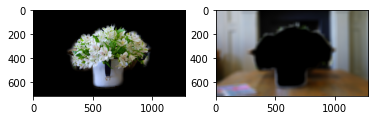

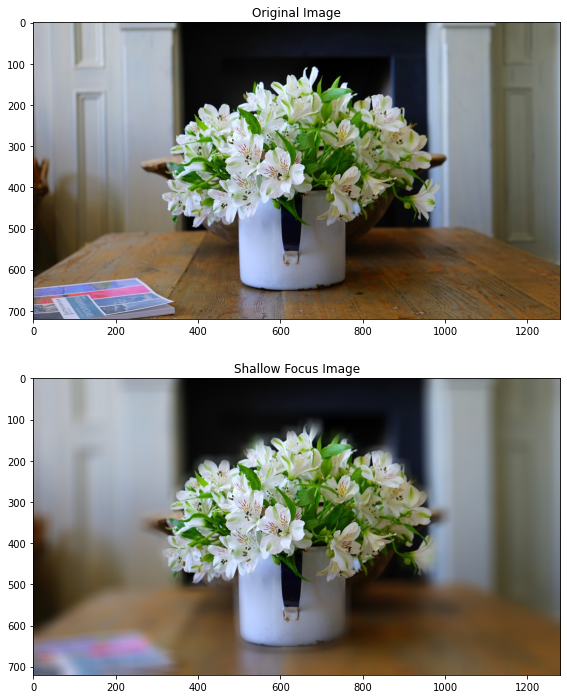

In [74]:
out_focus3('plant', 35)

이 사진은 person입니다.


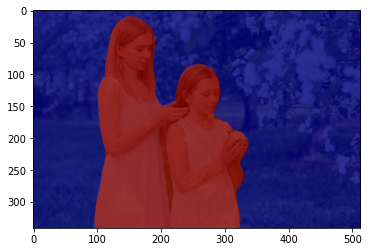

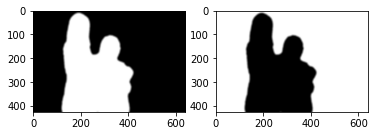

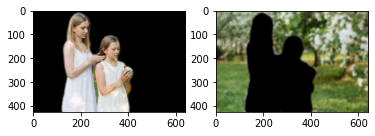

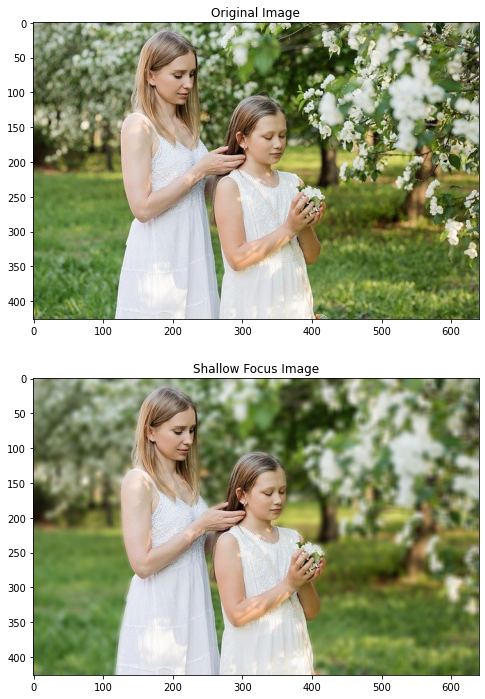

In [76]:
out_focus3('mom')

## 크로마키 합성하기

[galaxy](https://pixabay.com/ko/photos/%ec%9a%b0%ec%a3%bc-%ea%b9%8a%ec%9d%80-%ea%b3%b5%ea%b0%84-%ec%9d%80%ed%95%98-%ec%84%b1%ec%9a%b4-2638126/)

[cat feat.유효정님](https://aiffel.agit.io/g/300308438/wall/324487270#comment_panel_324492062)

(720, 1280, 3)


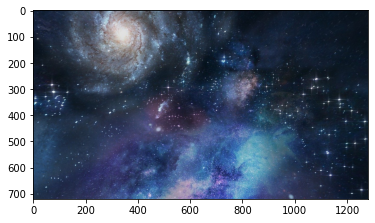

In [46]:
# 배경이 될 사진 불러와서 크기 확인

img_path_galaxy = '/content/drive/MyDrive/Colab/human_segmentation/images/galaxy.jpg'
galaxy_orig = cv2.imread(img_path_galaxy) 
#galaxy_orig = cv2.flip(galaxy_orig, 1) # 좌우 대칭으로 불러오기
print (galaxy_orig.shape)

plt.imshow(cv2.cvtColor(galaxy_orig, cv2.COLOR_BGR2RGB))
plt.show()

(1530, 1242, 3)


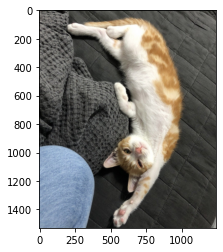

In [47]:
# 고양이 사진 불러와서 크기 확인

img_path_cat = '/content/drive/MyDrive/Colab/human_segmentation/images/cat.jpg'
cat_orig = cv2.imread(img_path_cat) 
print (cat_orig.shape)

plt.imshow(cv2.cvtColor(cat_orig, cv2.COLOR_BGR2RGB))
plt.show()

(1242, 1530, 3)


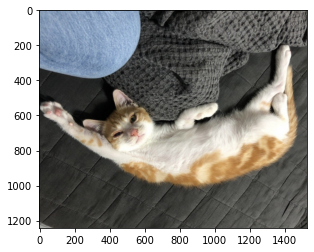

In [48]:
# 원본 이미지를 시계방향으로 90도 만큼 회전
cat_orig = cv2.rotate(cat_orig, cv2.ROTATE_90_CLOCKWISE)
print (cat_orig.shape)

plt.imshow(cv2.cvtColor(cat_orig, cv2.COLOR_BGR2RGB))
plt.show()

(720, 886, 3)


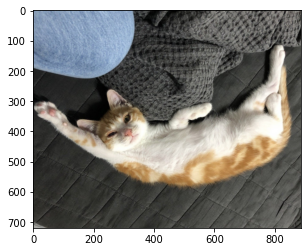

In [49]:
# 배경 이미지와 세로 길이 맞춰주기

ratio = cat_orig.shape[1]/cat_orig.shape[0]
height = galaxy_orig.shape[0]
width = int(height*ratio)

cat_orig = cv2.resize(cat_orig, (width, height), interpolation=cv2.INTER_AREA)
print (cat_orig.shape)

plt.imshow(cv2.cvtColor(cat_orig, cv2.COLOR_BGR2RGB))
plt.show()

(720, 1280, 3) (720, 1280, 3)


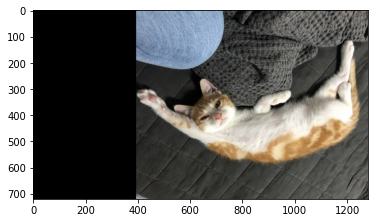

In [50]:
# 배경과 크기를 맞춰주기 위해 왼쪽 공간을 검은색으로 채움

pad = galaxy_orig.shape[1] - cat_orig.shape[1]

cat_padding = cv2.copyMakeBorder(cat_orig,
                                  top = 0,
                                  bottom = 0,
                                  left = pad,
                                  right = 0,
                                  borderType = cv2.BORDER_CONSTANT,
                                  value=[0,0,0])

print (galaxy_orig.shape, cat_padding.shape)
plt.imshow(cv2.cvtColor(cat_padding, cv2.COLOR_BGR2RGB))
plt.show()

In [51]:
# 네트워크에 넣기

cat_resized, cat_map = MODEL.run(cat_padding)
print (cat_orig.shape, cat_resized.shape, cat_map.max())
LABEL_NAMES[cat_map.max()]

(720, 886, 3) (288, 513, 3) 8


'cat'

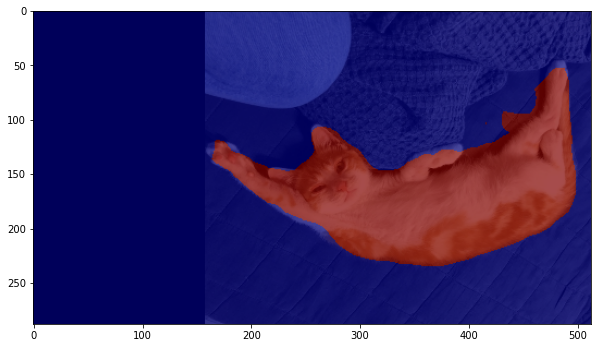

In [52]:
cat_show = cat_resized.copy() # 리사이즈 이미지 저장
cat_map = np.where(cat_map == 8, 8, 0) # 예측 중 픽셀값이 8 인 cat만 추출
cat_mask = cat_map * (255/cat_map.max()) # 255 normalization
# cat_max.max() = 8 이므로 cat_map / cat_map.max()는 0과 1로 이루어진 행렬
# 255를 곱했으므로 고양이인 부분은 255, 고양이가 아닌 부분은 0인 마스크가 만들어진다
cat_mask = cat_mask.astype(np.uint8)
color_mask = cv2.applyColorMap(cat_mask, cv2.COLORMAP_JET)
cat_show = cv2.addWeighted(cat_show, 0.3, color_mask, 0.7, 0.0)

# 시맨틱 세그멘테이션 : 고양이와 고양이가 아닌걸 다른 색으로 구분
fig = plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(cat_show, cv2.COLOR_BGR2RGB))
plt.show()

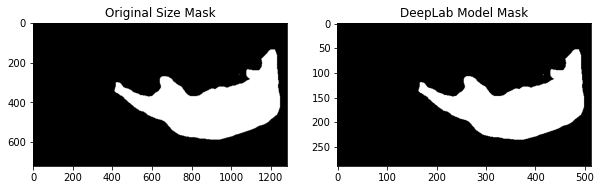

In [53]:
# 고양이만 보이는 마스크를 원본 사이즈로 리사이징
cat_mask_up = cv2.resize(cat_mask, cat_padding.shape[:2][::-1], interpolation=cv2.INTER_LINEAR)

_, cat_mask_up = cv2.threshold(cat_mask_up, 128, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(10, 8))

ax = plt.subplot(1,2,1)
plt.imshow(cat_mask_up, cmap=plt.cm.binary_r)
ax.set_title('Original Size Mask')

ax = plt.subplot(1,2,2)
plt.imshow(cat_mask, cmap=plt.cm.binary_r)
ax.set_title('DeepLab Model Mask')

plt.show()

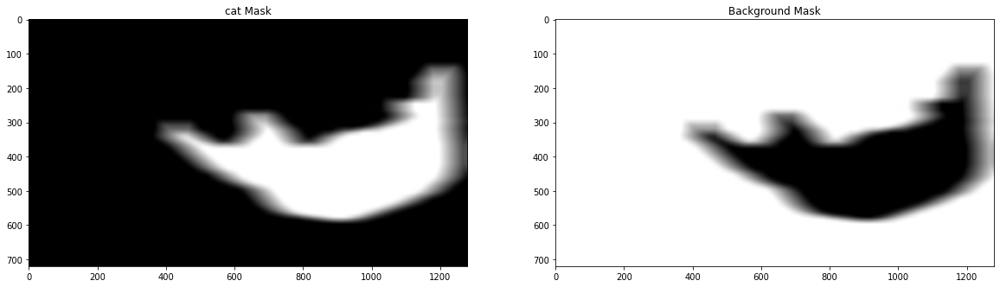

In [54]:
# 고양이만 보이는 마스크를 원본 이미지와 같은 채널로 변환
cat_mask_3C = np.repeat(np.expand_dims(cat_mask_up, axis=2), 3, axis=2).astype(np.uint8)
# 한 픽셀에 하나의 숫자 0, 255만 나타나있는 cat_mask 매트릭스를
# 한 픽셀에 [0,0,0], [255,255,255]인 텐서로 바꿔주는 역할

# 고양이만 보이는 마스크 블러 처리
cat_Bmask = (cv2.blur(cat_mask_3C, (100, 20))/255).astype(np.float32)
# blur 함수로 픽셀들의 값이 [0,225] 사이의 값으로 부드럽게 바뀌고
# 255로 나눠주었으므로 [0,1] 사이의 값이 됨

# 마스크를 리버스해서 배경만 보이는 마스크 만들기
bg_Bmask = 1 - cat_Bmask
# 값들이 float라서 노드처럼 bitwise 연산을 할 수는 없고
# 대신 1에서 마스크의 값을 빼주면 완벽하게 뒤집힌 마스크를 얻을 수 있음

fig = plt.figure(figsize=(20, 15)) 

ax = plt.subplot(1,2,1)
plt.imshow(cat_Bmask, cmap=plt.cm.binary_r) # 고양이만 보이는 블러마스크
ax.set_title('cat Mask')

ax = plt.subplot(1,2,2)
plt.imshow(bg_Bmask, cmap=plt.cm.binary_r) # 배경만 보이는 블러 마스크 
ax.set_title('Background Mask')

plt.show()

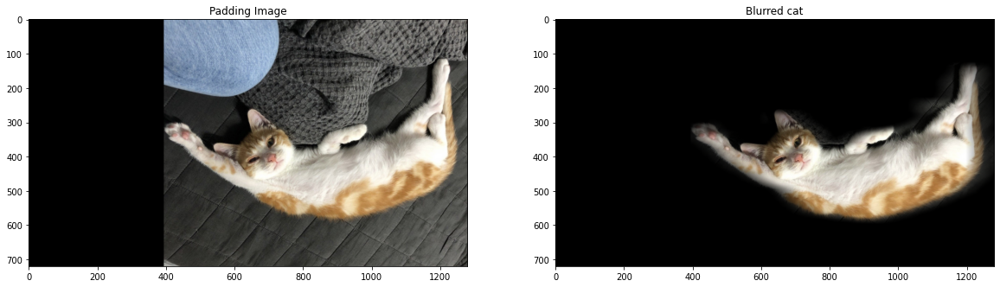

In [55]:
# 고양이만 보이는 마스크 * 원본이미지 로
# 경계면이 블러 처리된 고양이 얻기

# 곱연산
cat_image_Hblur = cat_Bmask*cat_padding.astype(np.float32)
# 이제 두 텐서를 원소별 곱연산 해주면, 경계는 원본의 픽셀값이 0.x 배로 감소해서 연해짐
# 고양이부분은 1 이므로 원본 이미지의 픽셀값이 그대로이므로 흐려지지 않음


fig = plt.figure(figsize=(20, 15)) 

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(cat_padding, cv2.COLOR_BGR2RGB))
ax.set_title('Padding Image')

ax = plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(cat_image_Hblur.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('Blurred cat')

plt.show()

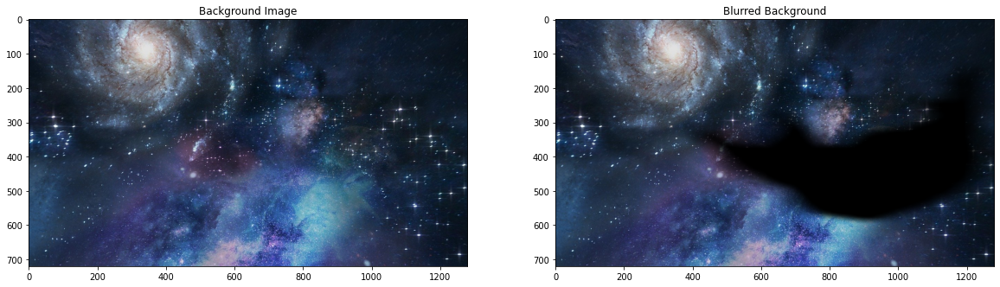

In [56]:
# 배경만 보이는 마스크 * 배경이미지 로
# 고양이가 들어갈 자리가 비어있는 배경 얻기

bg_image_Hblur = bg_Bmask*galaxy_orig.astype(np.float32)

fig = plt.figure(figsize=(20, 15)) 

ax = plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(galaxy_orig, cv2.COLOR_BGR2RGB))
ax.set_title('Background Image')

ax = plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(bg_image_Hblur.astype(np.uint8),cv2.COLOR_BGR2RGB))
ax.set_title('Blurred Background')

plt.show()

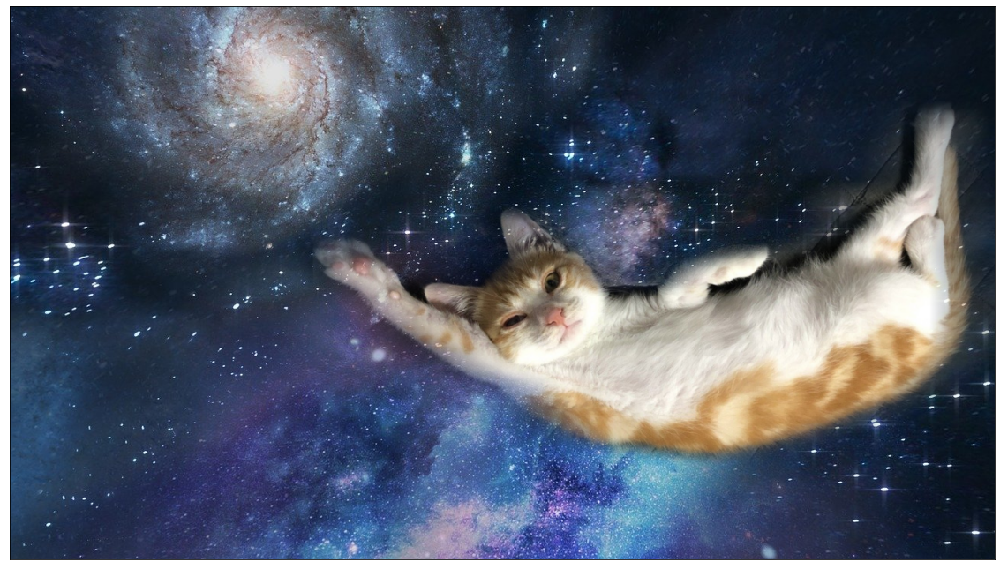

In [57]:
# 두 이미지를 합해서 최종 이미지 획득

final_image = (cat_image_Hblur+bg_image_Hblur).astype(np.uint8)

fig = plt.figure(figsize=(20, 15)) 

plt.imshow(cv2.cvtColor(final_image,cv2.COLOR_BGR2RGB))
plt.xticks([]) #x좌표 눈금 제거
plt.yticks([]) #y좌표 눈금 제거
plt.show()

## 인물 모드 문제점 찾기

### 세그멘테이션을 이용한 인물모드의 한계
- 피사계심도를 이용한 보케 효과는 심도를 표현하기 때문에 초점이 잡힌 거리를 광학적으로 아주 섬세하게 구별하지만 이를 따라한 시멘틱 세그멘테이션 모듈은 완벽히 구현하기 힘들다.

- 결국 세그멘테이션을 이용한 인물모드 사진은 객체와 객체가 아닌 것을 구분한 것이므로 shallow focus 효과와는 작동원리가 완전히 다르다.

- 게다가 배경에 일괄적으로 동일한 블러효과를 적용하므로, 가까운 배경과 먼 배경 사이의 차이가 두드러지지 않는다는 단점이 있다.

### 피사계심도 이해하기

[피사계심도](https://ko.wikipedia.org/wiki/%ED%94%BC%EC%82%AC%EA%B3%84_%EC%8B%AC%EB%8F%84)

- 사진술에서 한 사진의 초점이 맞은 것으로 인식되는 범위의 한계

- 렌즈의 초점은 단 하나의 면에 정해지게 되어 있으나 실제 사진에서는 초점면을 중심으로 서서히 흐려지는 현상이 나타남

### 스마트폰으로는 아웃포커싱이 불가능한가?

- 원리만 따져보자면 스마트폰으로도 가능하다.

- 마찬가지로 피사계 심도를 벗어나서 초점이 맞지 않는 부분은 흐리게 표현된다.

- 다만 카메라 스펙의 차이로 그 정도가 매우 미미해서 DSLR 만큼의 효과를 볼 수 없을 뿐이다.



### 접근 방향

참고자료 \
[3D 깊이 카메라 기술](https://m.blog.naver.com/panoptics/221336152952) \
[단일 카메라를 이용한 3D 깊이 추정 방법](http://www.kibme.org/resources/journal/20190411153555246.pdf) \
[깊이 추정 방법 및 장치, 전자 기기, 프로그램 및 매체](https://doi.org/10.8080/1020207009470)
 \
 \

- 광학적으로 초점을 흐리지 못한다면, 심도를 계산해서 흐리게 만들어줄 수 없을까?

- 이미 촬영된 사진에 의 심도를 얻어내려면?
 - 관심 있는 객체의 경계선 안팎에서 사진이 흐려지는 정도를 계산해서 더 많이 흐려진 부분은 객체와 멀리 떨어진 부분으로 판단
 - 미리 양안 이미지를 학습시킨 네트워크에 집어넣고 돌려서 획득한 반대 이미지를 이용해 심도 계산(..)

- 사진을 촬영 할 때부터 심도 계산을 염두에 두고 촬영하려면?
 - 하나의 카메라로 초점이 다른 여러 사진 촬영
   - 같은 위치에서 초점이 흐려지는 정도를 이용해 심도 계산
   - 한장의 사진만으로는 흐린 부분이 초점보다 가까운지 먼지를 판단하기 힘들기 때문에, 두장 이상의 사진으로 비교하면 정확도가 향상된다
 - 스펙이 같은 2개의 카메라로 양안 이미지를 생성
   - 카메라가 객체를 바라보는 각도의 차이를 이용해 심도 계산
   - 각도 차이가 적을수록 멀리 있으므로 블러 효과의 차이를 둘 수 있을 것 같다





## 해결 방안 순서도

#### 초점을 이용한 방법
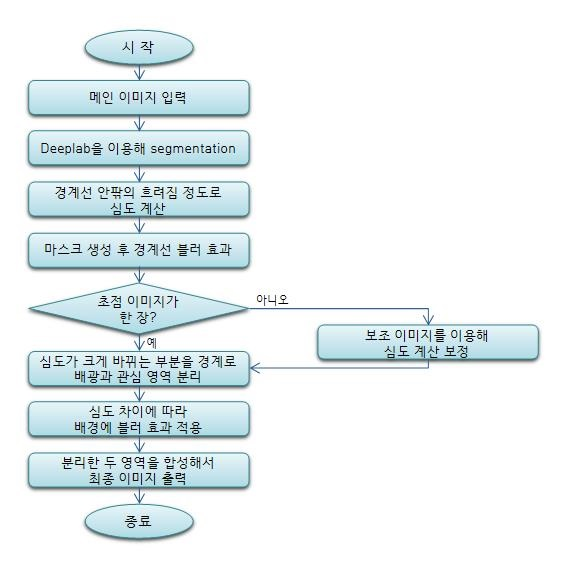

#### 두대의 카메라의 시야각을 이용하는 방법

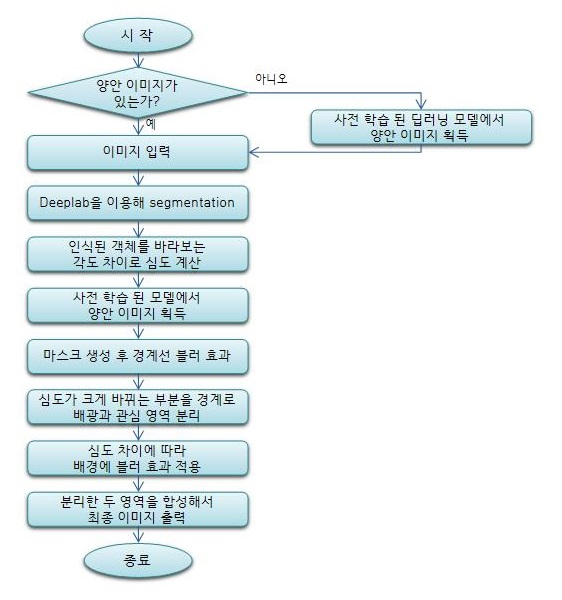

# 회고

가장 아쉬웠던 점은 고양이 크로마키 합성할때, 살짝 비스듬히 기울어진 모양으로 하고 싶었는데 고양이가 누워 있지 않으니 고양이로 인식을 못하더라..

주어진 DeepLab 모델의 한계인지, 아니면 내가 하이퍼파라미터를 조절해서 성능을 향상시킬 수 있는 부분인지 모르겠다.

코드를 한참 들여다 봤는데 반도 이해를 못했다ㅠㅠ

다음으로 똑같은 작업을 처리하는 코드를 묶을때, 그 동안 함수를 이용해서 만들었는데 이번엔 클래스 작성을 시도해보았다.

사실 만들어놓고 보니 함수랑 다를 바가 없어서 상속을 이용해서 변화를 시도했으나, argument어쩌고 하는 에러가 자꾸 뜨더라...

부모자식 상속까지는 괜찮았는데 손자클래스를 만드니 뭔가 자꾸 고장남.. 부모 클래스의 메서드를 super로 실행시키고 싶었는데 뭐가 문제였던 건지 알 수 없다..

그냥 포기하고 함수처럼 만들어버리고 사람대신 cat을 인식하는 클래스를 만들어서 상속시켰고,

만들다보니 꼭 cat일 필요는 없을 것 같아서 아무거나 인식해서 아웃포커싱 하도록 해봤다.

실패사진은 따로 집어넣지는 않았지만 인식이 실패하는 케이스도 꽤 있었다.

의자에 올라간 쿠션을 인식 못해서 구멍이 뚫린다거나, 펭귄을 새 대신 모터바이크로 인식한다거나(ㅋㅋ)..

순서도도 만들라기에 만들긴 만들었는데 너무 보잘 것 없어서 어이없다... 그냥 떡꼬치같기도 하고.. 

이것저것 코드들 실험하고 클래스나 함수 작성 공부한 것 같아서 재미있긴 했는데 딥러닝 모델에 대한 공부는 어디 갔지...?
